In [1]:
using Random, Statistics, Polynomials

In [2]:
using Plots
#using PyPlot
#using Makie

# 1. Implementation for MC algorithm using wolff cluster for xy model in 2d

Based on the code from recitation 8

In [3]:
# Structure representing a 2D point with integer coordinates
struct Point2D
    x::Int64
    y::Int64
end

# Structure representing a square lattice with specified dimensions
struct SquareLattice
    Nx::Int64
    Ny::Int64    
end

# Calculate the total number of sites in the lattice
import Base.length
function length(lat::SquareLattice)
    return lat.Nx * lat.Ny
end

# Convert a 2D point on the lattice to a linear index
function PointToIndex(lat::SquareLattice, r::Point2D)
    @assert r.x <= lat.Nx "Site x coordinate exceeding lattice length"
    @assert r.y <= lat.Ny "Site y coordinate exceeding lattice width"
    
    return (r.y - 1) * lat.Nx + r.x
end

# Convert a linear index to a 2D point on the lattice
function IndexToPoint(lat::SquareLattice, ind::Int64)
    @assert ind <= length(lat) "Site index exceeding lattice size"
    
    y = div(ind - 1, lat.Nx) + 1
    x = mod(ind - 1, lat.Nx) + 1

    return Point2D(x, y)
end
    
# Find the linear indices of the nearest neighbors of a site on the lattice
function NearestNeighbors(lat::SquareLattice, ind::Int64)
    r = IndexToPoint(lat, ind)
    
    nn = zeros(Int64, 4)
    
    xp = mod(r.x, lat.Nx) + 1
    yp = mod(r.y, lat.Ny) + 1
    xm = mod(r.x - 2, lat.Nx) + 1
    ym = mod(r.y - 2, lat.Ny) + 1
    
    nn[1] = PointToIndex(lat, Point2D(xm, r.y)) # Left neighbor
    nn[2] = PointToIndex(lat, Point2D(xp, r.y)) # Right neighbor
    nn[3] = PointToIndex(lat, Point2D(r.x, ym)) # Upper neighbor
    nn[4] = PointToIndex(lat, Point2D(r.x, yp)) # Lower neighbor
    
    return nn
end;

In [4]:
function IsingConfigurationEnergy(lat::SquareLattice, c::Vector{Float64})
    # Calculate the energy of an Ising configuration on a square lattice.
    
    N = length(lat)
    @assert N == length(c) "Configuration incompatible with lattice size"
    
    Ec = 0.
    
    for j in range(1, length = N)
        nn = NearestNeighbors(lat, j)
        # Energy contribution from the current site
        bond_energy = -sum(cos.(c[nn].-c[j]))
        Ec += bond_energy
    end
    return Ec/2  # In the summation above, every bond is included twice
end;

In [5]:
function calcMagnetization(c)
    Sx = cos.(c)
    Sy = sin.(c)
    Mx = mean(Sx)
    My = mean(Sy)
    return sqrt(Mx^2+My^2)
end;

In [6]:
function IsingMC(lat::SquareLattice, T::Float64, Nsw::Int64, clusterUpdates = false, saveConfigs = false)
    # Perform Ising Monte Carlo simulations.

    # Parameters:
    # - `lat`: SquareLattice object representing the lattice.
    # - `T`: Temperature.
    # - `Nsw`: Number of sweeps to perform.
    # - `clusterUpdates`: Perform cluster updates if true, single-spin updates if false.
    # - `saveConfigs`: Save configurations at each sweep if true.

    c = rand(length(lat))*2*π  # Initialize random spin configuration.
    if saveConfigs
        configs = zeros(Float64, Nsw, length(lat))  # Matrix to store configurations at each sweep.
        configs[1, :] = c  # Save initial configuration.
    end
    
    m = zeros(Float64, Nsw)  # Array to store magnetization at each sweep.
    m[1]= calcMagnetization(c)
    
    En = zeros(Float64, Nsw)  # Array to store energy at each sweep.
    En[1] = IsingConfigurationEnergy(lat, c)  # Initial energy.
    
    for i in range(2, stop=Nsw)  # Loop over sweeps.
        
        if clusterUpdates
            IsingWolffUpdate!(lat, c, T)  # Perform cluster update.
            En[i] = IsingConfigurationEnergy(lat, c)  # Calculate new energy.
        else
            @assert false
            dEi = IsingMetropolisSweep!(lat, c, T)  # Perform single-spin Metropolis update and get energy change.
            En[i] = En[i-1] + dEi  # Update total energy.
        end
        
        if saveConfigs
            configs[i, :] = c  # Save current configuration.
        end

        m[i]= calcMagnetization(c)

    end
    
    if saveConfigs
        return m, En, configs
    else
        return m, En
    end
    
end;

# Cluster updates

In [74]:
function IsingWolffUpdate!(lat::SquareLattice, c::Vector{Float64}, T::Float64)

    N = length(lat)
    
    @assert N == length(c) "Configuration incompatible with lattice size"
    
    random_θ = rand()*2*π
    i = rand(1:N) # pick a random site
    
    cluster = Int64[] # indices of spins in the cluster
    newlyAdded = Int64[] # indices of newly added neighbors

    push!(cluster, i)
    append!(newlyAdded, NearestNeighbors(lat, i))

    while !isempty(newlyAdded)
        j = pop!(newlyAdded)
        if j in cluster
            continue
        end
        p = 1.0 - exp(minimum([0,-2*cos(c[i]-random_θ)*cos(c[j]-random_θ)/T]))
        if rand() < p
            push!(cluster, j)
            nn = NearestNeighbors(lat, j)
            append!(newlyAdded, nn)
        end
    end

    #c[cluster] = 1 .- c[cluster] # flip the cluster
    #c[cluster] .= mod.(c[cluster] .+ (2*(c[cluster].-random_θ)) .+ π,2*π) # flip the cluster
    x_arr = cos.(c[cluster])
    y_arr = sin.(c[cluster])
    x_arr .-= 2*cos(random_θ)*cos.(random_θ .- c[cluster])
    y_arr .-= 2*sin(random_θ)*cos.(random_θ .- c[cluster])
    c[cluster] .= mod.(angle.(x_arr .+ im*y_arr),2*π)
end;

In [75]:
function CalculateError(m, Neq, Nsw)
    # Function to calculate the error in the mean magnetization using binning analysis
    
    err = Float64[]

    # Determine the number of sweeps for error analysis
    Nsw2 = 2^Int(floor(log(2, Nsw-Neq))) # closest power of 2 smaller than the number of sweeps after equilibration

    # Extract the last Nsw2 magnetization values for error analysis
    ml = m[end-Nsw2+1:end]

    # Set the minimum size for the moving block (binning) analysis
    min_size = 2^5

    # Perform the moving block (binning) analysis
    while length(ml) > min_size
        # Compute the standard error of the mean and append to the error array
        push!(err, std(ml) / sqrt(length(ml) - 1))

        # Reduce the size of the data by taking the mean of consecutive pairs (binning)
        ml = map(j -> mean(ml[2*j-1:2*j]), range(1, stop=div(length(ml),2)))
    end

    return err
end;

# 2. 

Calculating equalibrium times and autocorrelations times for $ T \in \{ 0.01 ,0.1 , 1.0 , 1.5\} $ 

In [80]:
N = 32
lat = SquareLattice(N,N)
Nsw = 50000
#T_arr = [0.1 , 0.5 , 0.8, 1. , 1.2 , 1.5, 2. , 5.]
T_arr = [0.01 ,0.1, 1., 1.5]
m_arr = fill(zeros(Float64, Nsw), length(T_arr))
En_arr = fill(zeros(Float64, Nsw), length(T_arr))
configs_arr = fill(zeros(Float64, Nsw, length(lat)), length(T_arr))

for (i,T) in enumerate(T_arr)
    @time m_arr[i] , En_arr[i], configs_arr[i] = IsingMC(lat, T, Nsw, true, true)
end;

 65.679188 seconds (253.02 M allocations: 30.682 GiB, 2.09% gc time)
 58.060657 seconds (243.89 M allocations: 28.826 GiB, 2.15% gc time)
 27.623196 seconds (199.42 M allocations: 20.548 GiB, 2.86% gc time)
 12.899302 seconds (156.60 M allocations: 15.174 GiB, 3.39% gc time)


Finding Equalibrium time by looking at the graphs of the energies and total magnetization:

Total magnetization graphs:

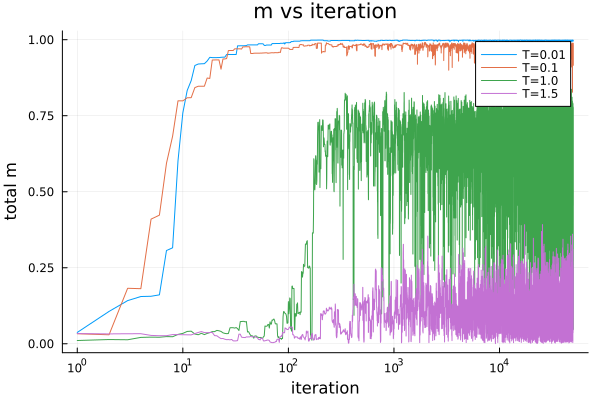

In [83]:
plot()
for (i,T) in enumerate(T_arr)
    plot!(1:Nsw,m_arr[i],xlabel="iteration",ylabel="total m",title="m vs iteration",label="T=$T",xaxis=:log)
end
plot!()

Energy graphs:

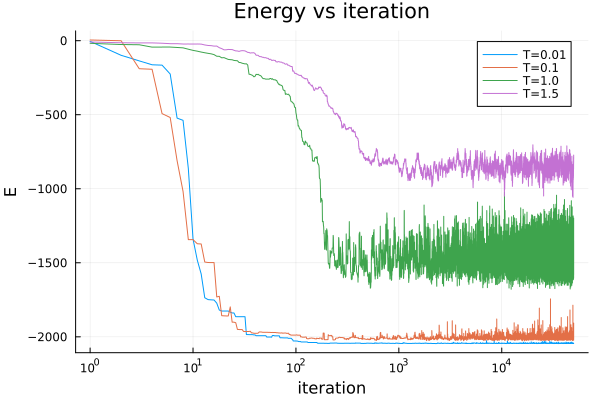

In [84]:
plot()
for (i,T) in enumerate(T_arr)
    plot!(1:Nsw,En_arr[i],xlabel="iteration",ylabel="E",title="Energy vs iteration",label="T=$T",xaxis=:log)
end
plot!()

Finding Equalibrium time (Using Neq=0 and the algorithm for calculating autocorrelation time with it):

T=0.01, equalibrium times time: 41.0
T=0.1, equalibrium times time: 9.0
T=1.0, equalibrium times time: 6.0
T=1.5, equalibrium times time: 18.0


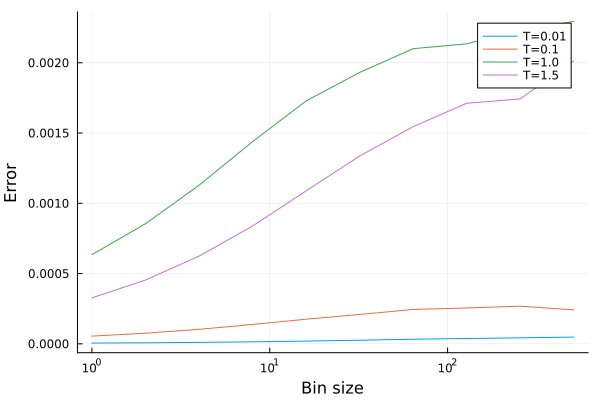

In [93]:
equalibrium_time_arr = zeros(length(T_arr))
plot()
for (i,T) in enumerate(T_arr)
    Neq = 0
    err = CalculateError(m_arr[i], Neq, Nsw)
    equalibrium_time_arr[i] = round(((err[end]/err[1])^2-1)/2)
    println("T=$T, equalibrium times time: ", equalibrium_time_arr[i] )
    plot!(2 .^ range(0, length= length(err)), err,label="T=$T",ylabel="Error",xlabel="Bin size",xaxis=:log)
end;
plot!()

Setting Equalibrium times according to the former method (by estimating where the thermal fluctioations begin)

In [95]:
equalibrium_time_arr[1]=100
equalibrium_time_arr[2]=1000
equalibrium_time_arr[3]=2000
equalibrium_time_arr[4]=3000;

Autocorrelation time (using Neq= 1000*equalibrium_time, as recommended in Troyer 5.5.4 to be much larger than the equalibrium time)

T=0.01, Autocorrelation time: 41.0
T=0.1, Autocorrelation time: 9.0
T=1.0, Autocorrelation time: 5.0
T=1.5, Autocorrelation time: 17.0


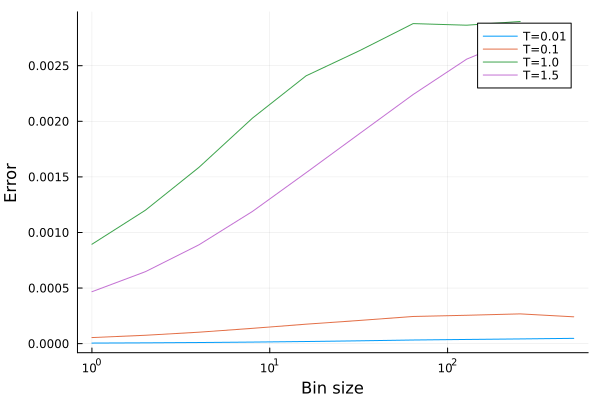

In [98]:
autocorrelation_time_arr = zeros(length(T_arr))
plot()
for (i,T) in enumerate(T_arr)
    Neq = equalibrium_time_arr[i]*10
    err = CalculateError(m_arr[i], Neq, Nsw)
    autocorrelation_time_arr[i] = round(((err[end]/err[1])^2-1)/2)
    println("T=$T, Autocorrelation time: ", autocorrelation_time_arr[i] )
    plot!(2 .^ range(0, length= length(err)), err,label="T=$T",ylabel="Error",xlabel="Bin size",xaxis=:log)
end;
plot!()

In [87]:
function plot_spin_config(configs ,T ,autocorrelation_time, is_heatmap=true)
    println("T = $T")
    println("Autocorrelation time = $autocorrelation_time")
    spin_grid1 = reshape(configs[end,:],(N,N))
    spin_grid2 = reshape(configs[end-autocorrelation_time,:],(N,N))
    spin_grid3 = reshape(configs[end-2*autocorrelation_time,:],(N,N))
    spin_grid4 = reshape(configs[end-3*autocorrelation_time,:],(N,N))

    if !is_heatmap
        scale=1
        x = repeat(1:N, N)
        y = repeat((1:N)', N)
        
        spins_x1 = cos.(spin_grid)/scale
        spins_y1 = sin.(spin_grid)/scale
        q1=quiver(x[:], y[:], quiver=(spins_x[:], spins_y[:]), title= "t=end ")

        spins_x2 = cos.(spin_grid)/scale
        spins_y2 = sin.(spin_grid)/scale
        q2=quiver(x[:], y[:], quiver=(spins_x2[:], spins_y2[:]), title= "t=end-Δt ")

        spins_x3 = cos.(spin_grid)/scale
        spins_y3 = sin.(spin_grid)/scale
        q3=quiver(x[:], y[:], quiver=(spins_x2[:], spins_y2[:]), title= "t=end-2Δt ")
    else
        is_colorbar=true
        q1 = heatmap(spin_grid1,colormap=:hsv, colorbar=is_colorbar)
        q2 = heatmap(spin_grid2,colormap=:hsv, colorbar=is_colorbar)
        q3 = heatmap(spin_grid3,colormap=:hsv, colorbar=is_colorbar)
        q4 = heatmap(spin_grid4,colormap=:hsv, colorbar=is_colorbar)
    end
    
    #p=plot(q1,q2,q3, layout = grid(1,3,widths = [ 1/3 ,1/3 ,1/3]), size=(1000,300))
    p=plot(q1,q2,q3,q4, layout = grid(1,4,widths = [1/4 ,1/4 ,1/4 ,1/4]), size=(1000,300))
    return p
    
end;

Plotting configurations for T = 0.01 , seperated by multiples of autocorrelation time:

T = 0.01
Autocorrelation time = 25


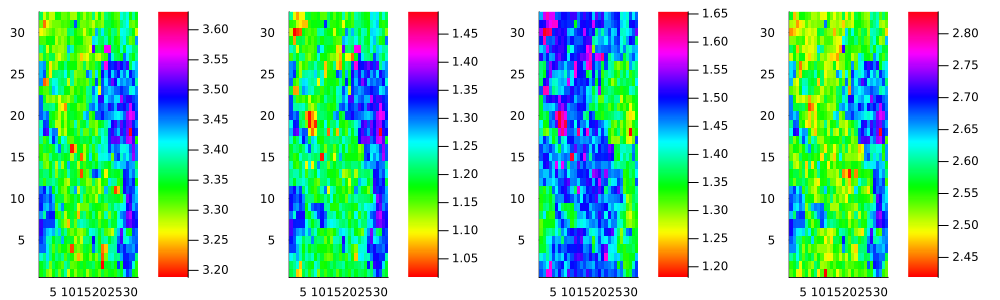

In [88]:
i=1
p=plot_spin_config(configs_arr[i] ,T_arr[i] ,Int(autocorrelation_time_arr[i]))
plot(p)

Plotting configurations for T = 0.1 , seperated by multiples of autocorrelation time:

T = 0.1
Autocorrelation time = 9


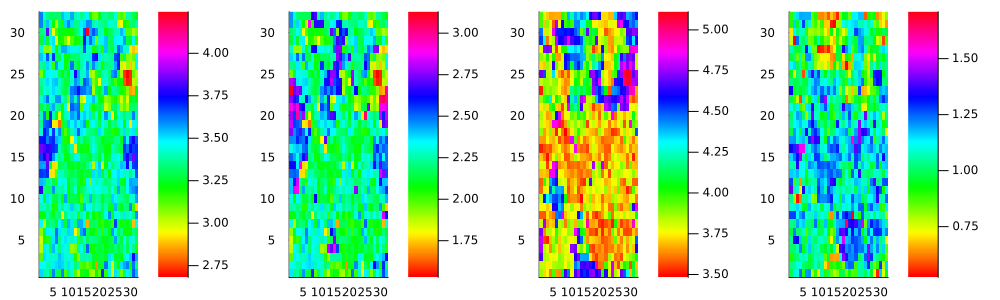

In [89]:
i=2
p=plot_spin_config(configs_arr[i] ,T_arr[i] ,Int(autocorrelation_time_arr[i]))
plot(p)

Plotting configurations for T = 1. , seperated by multiples of autocorrelation time:

T = 1.0
Autocorrelation time = 6


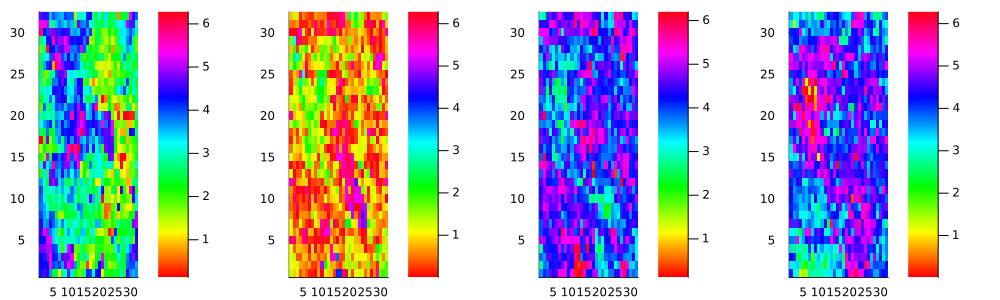

In [90]:
i=3
p=plot_spin_config(configs_arr[i] ,T_arr[i] ,Int(autocorrelation_time_arr[i]))
plot(p)

Plotting configurations for T = 1.5 , seperated by the Autocorrelation time:

T = 1.5
Autocorrelation time = 17


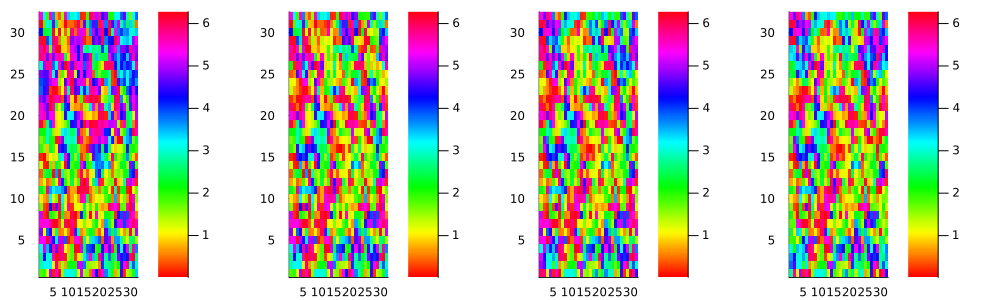

In [91]:
i=4
p=plot_spin_config(configs_arr[i] ,T_arr[i] ,Int(autocorrelation_time_arr[i]))
plot(p)

 ## 3. spin-spin correlation function

In [18]:
function circular_distance(p1, p2, Nx, Ny, manhatan=true)
    dx = abs(p1[1] - p2[1])
    dy = abs(p1[2] - p2[2])

    # Account for wraparound
    dx = min(dx, Nx - dx)
    dy = min(dy, Ny - dy)

    # Use Euclidean distance
    return manhatan ? dx+dy : sqrt(dx^2 + dy^2)
end;

In [42]:
function spin_spin_correlation_function(lat::SquareLattice, c::Vector{Float64})
    max_distance= Int(floor(sqrt((lat.Nx/2)^2+(lat.Ny/2)^2)))
    r_arr = [r for r in 0:max_distance]
    c_grid = reshape(c,(lat.Nx,lat.Ny))
    distances_dictionary= Dict()
    for x1 in 1:lat.Nx
        for y1 in 1:lat.Ny
            for x2 in 1:lat.Nx
                for y2 in 1:lat.Ny
                    dist = circular_distance((x1,y1),(x2,y2),lat.Nx,lat.Ny)
                    index1=PointToIndex(lat,Point2D(x1,y1))
                    index2=PointToIndex(lat,Point2D(x2,y2))
                    if haskey(distances_dictionary,dist)
                        distances_dictionary[dist][1] += 1
                        distances_dictionary[dist][2] += cos(c[index1]-c[index2])
                        distances_dictionary[dist][3] = distances_dictionary[dist][2]/distances_dictionary[dist][1]
                    else
                        distances_dictionary[dist]= [1,cos(c[index1]-c[index2]),cos(c[index1]-c[index2])]
                    end
                end
            end
        end
    end
    return distances_dictionary
end;

Low temperatures:

In [28]:
dict= Dict()

Dict{Any, Any}()

In [47]:
distances_dictionary=spin_spin_correlation_function(lat,configs_arr[i][end,:])

Dict{Any, Any} with 33 entries:
  5  => [20480.0, 1319.72, 0.0644396]
  16 => [63488.0, 1389.34, 0.0218835]
  20 => [49152.0, 870.583, 0.0177121]
  12 => [49152.0, 1355.02, 0.0275679]
  24 => [32768.0, 1624.74, 0.0495831]
  28 => [16384.0, 1237.42, 0.0755263]
  8  => [32768.0, 665.101, 0.0202973]
  17 => [61440.0, 1277.48, 0.0207923]
  30 => [8192.0, 702.276, 0.0857271]
  1  => [4096.0, 1547.59, 0.37783]
  19 => [53248.0, 935.761, 0.0175736]
  0  => [1024.0, 1024.0, 1.0]
  22 => [40960.0, 997.423, 0.0243511]
  6  => [24576.0, 1171.67, 0.0476755]
  23 => [36864.0, 1192.32, 0.0323437]
  11 => [45056.0, 888.461, 0.019719]
  32 => [1024.0, 78.4768, 0.0766375]
  9  => [36864.0, 603.741, 0.0163775]
  31 => [4096.0, 327.729, 0.0800119]
  14 => [57344.0, 1518.24, 0.026476]
  3  => [12288.0, 1801.39, 0.146598]
  29 => [12288.0, 893.304, 0.0726973]
  7  => [28672.0, 1008.48, 0.035173]
  25 => [28672.0, 1644.41, 0.0573526]
  4  => [16384.0, 1607.68, 0.0981247]
  ⋮  => ⋮

In [48]:
for (key,val) in enumerate(distances_dictionary)
    println("$key $val")
end

1 Pair{Any, Any}(5, [20480.0, 1319.7229018831968, 0.06443959481851547])
2 Pair{Any, Any}(16, [63488.0, 1389.3407785802028, 0.02188351780777789])
3 Pair{Any, Any}(20, [49152.0, 870.5827027730268, 0.017712050430766332])
4 Pair{Any, Any}(12, [49152.0, 1355.0193405590842, 0.027567939057598554])
5 Pair{Any, Any}(24, [32768.0, 1624.7379684771695, 0.04958306788565581])
6 Pair{Any, Any}(28, [16384.0, 1237.422708457862, 0.0755262883580238])
7 Pair{Any, Any}(8, [32768.0, 665.1013640323504, 0.020297282837901318])
8 Pair{Any, Any}(17, [61440.0, 1277.4758506202427, 0.020792250172855513])
9 Pair{Any, Any}(30, [8192.0, 702.2763397325094, 0.08572709225250359])
10 Pair{Any, Any}(1, [4096.0, 1547.592639251796, 0.377830234192333])
11 Pair{Any, Any}(19, [53248.0, 935.7609117007225, 0.01757363491024494])
12 Pair{Any, Any}(0, [1024.0, 1024.0, 1.0])
13 Pair{Any, Any}(22, [40960.0, 997.4230845498201, 0.024351149525142092])
14 Pair{Any, Any}(6, [24576.0, 1171.6738487602045, 0.047675530955411966])
15 Pair{Any, 

In [58]:
configs_arr[i][1,:]

1024-element Vector{Float64}:
 6.26502339383577
 2.784391030037053
 0.6706748361572712
 5.575679268922879
 4.9552229197636395
 0.29791165536165853
 4.4009569929023336
 3.692356077912238
 4.573602522636727
 6.222111226606572
 1.695540081204805
 4.127851190298007
 4.246469519854596
 ⋮
 6.220772981585304
 5.609341055253884
 6.099960221424165
 0.5135262739006238
 1.672113183322919
 4.103206596034632
 0.2724390043738523
 0.8904494096462492
 5.127262272090641
 0.2620195631607239
 5.363043927144045
 4.307047394466979

In [62]:
i=1
C = zeros(N+1)
for j in (1000*Int(equalibrium_time_arr[i])):Nsw
    c= configs_arr[i][j,:]
    for dist in 0:N
        distances_dictionary_c = spin_spin_correlation_function(lat,c)
        C[dist+1] += distances_dictionary_c[dist][3] 
    end
end

LoadError: InterruptException:

High temperatures:

In [ ]:
function average_over_ensamble(lat, quantity_function,)

In [ ]:
Ls = Int64[8, 16, 24, 32]
Ts = range(0.6, stop=4., step=0.2)

Neq = Int64[100, 100, 200, 200]
Ntot = Neq*100

m = zeros(length(Ts), length(Ls))
dm = zeros(length(Ts), length(Ls))
tau = zeros(length(Ts), length(Ls))

for (j, L) in enumerate(Ls)
    
    lat = SquareLattice(L,L)
    for (k, T) in enumerate(Ts)
        mk, En = IsingMC(lat, T, Ntot[j], true);
        err = CalculateError(mk, Neq[j], Ntot[j])
        m[k,j] = mean(mk[ Neq[j] : end])
        dm[k,j] = err[end]
        tau[k,j] = ((err[end]/err[1])^2-1)/2
    end
end

In [ ]:
fig, ax = subplots(1,2, figsize=(10,3))
for (j, L) in enumerate(Ls)
    ax[1].errorbar(Ts,m[:,j],dm[:,j], marker=".", linestyle="dashed", label="L="*string(L))
end
ax[1].set_xlabel("T")
ax[1].set_ylabel("Magnetization per site");

ax[2].plot(Ts, tau, "--.")
ax[2].set_xlabel("T")
ax[2].set_ylabel("Autocorrelation time");

ax[1].legend()

In [ ]:
ind_Tc = 9
figure(figsize=(4,3))
plot(Ls, tau[ind_Tc,:], "--o")
xlabel("L")
ylabel("Autocorrelation time");
xscale("log")
yscale("log")

p = fit(log.(Ls), log.(tau[ind_Tc,:]), 1)
println("Dynamical critical exponent using Wolff cluster updates is ", round(p[1],digits = 2))